# Vehicle Detection Project

The goals / steps of this project are the following:

* Perform a Histogram of Oriented Gradients (HOG) feature extraction on a labeled training set of images and train a classifier Linear SVM classifier
* Optionally, you can also apply a color transform and append binned color features, as well as histograms of color, to your HOG feature vector. 
* Note: for those first two steps don't forget to normalize your features and randomize a selection for training and testing.
* Implement a sliding-window technique and use your trained classifier to search for vehicles in images.
* Run your pipeline on a video stream (start with the test_video.mp4 and later implement on full project_video.mp4) and create a heat map of recurring detections frame by frame to reject outliers and follow detected vehicles.
* Estimate a bounding box for vehicles detected.


## [Rubric](https://review.udacity.com/#!/rubrics/513/view) Points
### Here I will consider the rubric points individually and describe how I addressed each point in my implementation.  

---
### Writeup / README

#### 1. Provide a Writeup / README that includes all the rubric points and how you addressed each one.  You can submit your writeup as markdown or pdf.  [Here](https://github.com/udacity/CarND-Vehicle-Detection/blob/master/writeup_template.md) is a template writeup for this project you can use as a guide and a starting point.  

You're reading it!

In [1]:
from skimage.feature import hog
from sklearn.svm import LinearSVC
from sklearn.preprocessing import StandardScaler
# for scikit-learn >= 0.18 use:
from sklearn.model_selection import train_test_split
# from sklearn.cross_validation import train_test_split
from scipy.ndimage.measurements import label
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
from moviepy.editor import VideoFileClip
from IPython.display import HTML
import numpy as np
import pickle
import cv2
import glob
import time
import random
%matplotlib inline


# LOADING THE DATA

The `car_images` contains the list of car images along with the flip of these images so as to increase  the size of data set while `noncar_images` contains the list of non car images along with 50% of extra flipped images. 

In [2]:
car = glob.glob('./vehicle/*.png')
noncar= glob.glob('./nonvehicle/*.png')

car_images=[]
noncar_images=[]
for file in car:
    image =  mpimg.imread(file)
    car_images.append(image)
    car_images.append(np.fliplr(image))
for file in noncar:
    prob= random.randint(0,100)
    image =  mpimg.imread(file)
    noncar_images.append(image)
    if(prob>=50):
        noncar_images.append(np.fliplr(image))
    
    
print(len(noncar_images))
print(len(car_images))



13794
13884


#### Visualize Training Data

Here i have shown few of the training data of cars and noncars

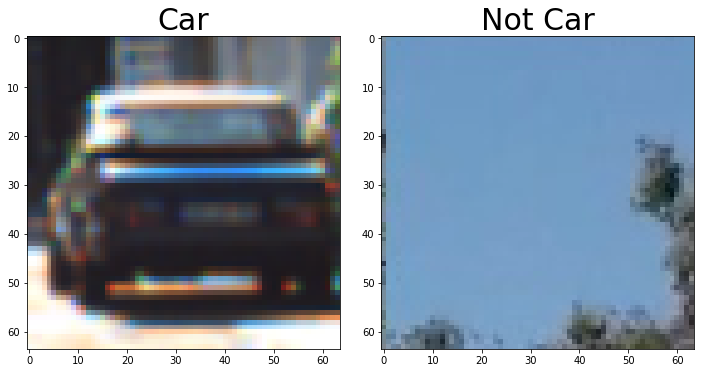

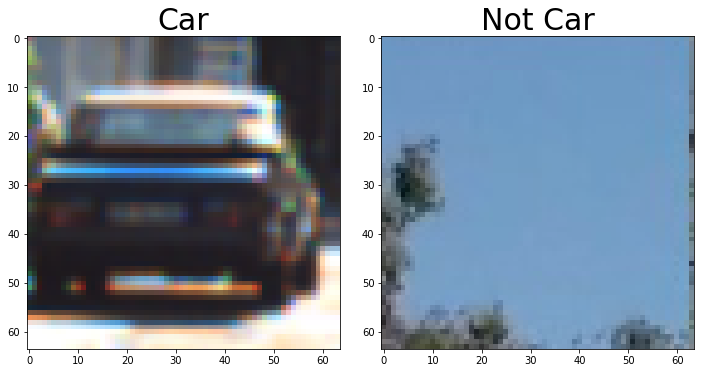

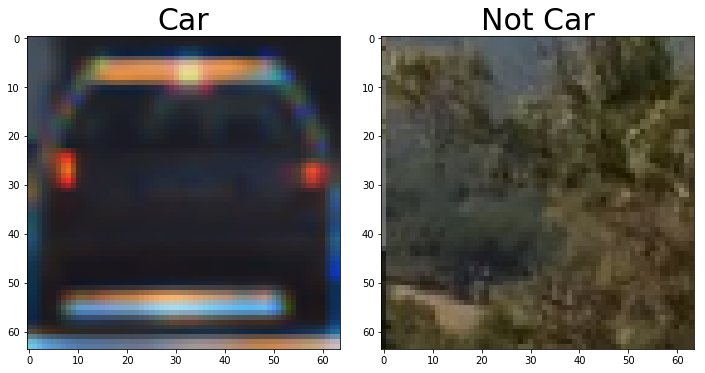

In [3]:
for i in range(3):
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))
    f.tight_layout()
    ax1.imshow(car_images[i])
    ax1.set_title('Car', fontsize=30)
    
    ax2.imshow(noncar_images[i], cmap='gray')
    ax2.set_title('Not Car', fontsize=30)
    

# Histogram of Oriented Gradients (HOG)

#### 1. Explain how (and identify where in your code) you extracted HOG features from the training images.

The `get_hog_features` function is taken from the lesson. It takes the image and return its hog_feature . To calculate the hog feature i tooked the `orient=9`, `pixels_per_cell = 16` and `cell_per_block = 2`

In [4]:
def get_hog_features(img, orient, pix_per_cell, cell_per_block, 
                        vis=False, feature_vec=True):
    # Call with two outputs if vis==True
    if vis == True:
        features, hog_image = hog(img, orientations=orient, 
                                  pixels_per_cell=(pix_per_cell, pix_per_cell),
                                  cells_per_block=(cell_per_block, cell_per_block), 
                                  transform_sqrt=False, 
                                  visualise=vis, feature_vector=feature_vec)
        return features, hog_image
    # Otherwise call with one output
    else:      
        features = hog(img, orientations=orient, 
                       pixels_per_cell=(pix_per_cell, pix_per_cell),
                       cells_per_block=(cell_per_block, cell_per_block), 
                       transform_sqrt=False, 
                       visualise=vis, feature_vector=feature_vec)
        return features


Here is an example using HOG parameters of `orientations=9`, `pixels_per_cell=(16, 16)` and `cells_per_block=(2, 2)`

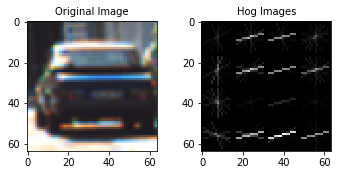

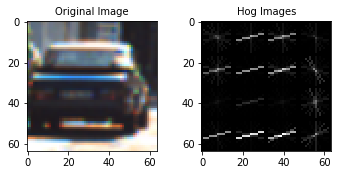

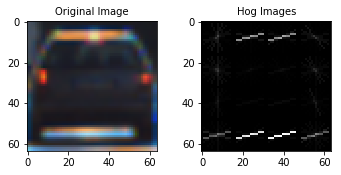

In [9]:
for i in range(3):
    image=car_images[i]
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    hog_image=get_hog_features(gray,9,16,2,vis=True)
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(5, 5))
    f.tight_layout()
    ax1.imshow(image)
    ax1.set_title('Original Image', fontsize=10)
    ax2.imshow(hog_image[1], cmap='gray')
    ax2.set_title('Hog Images', fontsize=10)

`extract_features` function  extract features from a list of image. This function is taken from the classroom but with slight modification . I am only extracting hog features of the images to detect the objects.
It takes the list of image , itterates through all of them and for each image it apply color conversion if the color space is anything other than RGB . After this it calls the `get_hog_feature` method to get the hog features and then put these features to the features list after changing it into contiguous flattened array using `ravel()` method

In [10]:
def extract_features(imgs, cspace='RGB', orient=9, 
                        pix_per_cell=8, cell_per_block=2, hog_channel=0):
    # Create a list to append feature vectors to
    features = []
    # Iterate through the list of images
    for file in imgs:
        # Read in each one by one
        image = np.copy(file)
        # apply color conversion if other than 'RGB'
        if cspace != 'RGB':
            if cspace == 'HSV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
            elif cspace == 'LUV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2LUV)
            elif cspace == 'HLS':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
            elif cspace == 'YUV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YUV)
            elif cspace == 'YCrCb':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YCrCb)
        else: feature_image = np.copy(image)      

        # Call get_hog_features() with vis=False, feature_vec=True
        if hog_channel == 'ALL':
            hog_features = []
            for channel in range(feature_image.shape[2]):
                hog_features.append(get_hog_features(feature_image[:,:,channel], 
                                    orient, pix_per_cell, cell_per_block, 
                                    vis=False, feature_vec=True))
            hog_features = np.ravel(hog_features)        
        else:
            hog_features = get_hog_features(feature_image[:,:,hog_channel], orient, 
                        pix_per_cell, cell_per_block, vis=False, feature_vec=True)
        # Append the new feature vector to the features list
        features.append(hog_features)
    return features


#### 2. Explain how you settled on your final choice of HOG parameters.

I started with the combination as it was given in the classroom but the accuracy was low and then I tried various other combinations of parameters like :`
colorspace = 'YUV' 
orient = 11
pix_per_cell = 16
cell_per_block = 2
hog_channel = 0`
But the accuracy turned out to be around 92-93 percent only. Then i tried with different color spaces like RGB , HLS but the accuracy was still below 95 % . When i tried with YcrCb and after tweaking the value of orientation from 11 to 9 the accuracy was quiet impressive. It turned out to be more than 97% which was good enough for training
The final parameters chosen were YCrCb colorspace, 9 orientations, 16 pixels per cell, 2 cells per block, and ALL channels of the colorspace. 


# TRAINING CLASSIFIER


#### 3. Describe how (and identify where in your code) you trained a classifier using your selected HOG features (and color features if you used them).

I trained a linear SVM with the classifier parameters as i have mentioned earlier and using HOG feature alone. By using this only i was able to get an accuracy of 97.95%



In [11]:
colorspace = 'YCrCb' 
orient = 9
pix_per_cell = 16
cell_per_block = 2
hog_channel = 'ALL' # Can be 0, 1, 2, or "ALL"

t = time.time()


#Extract the HOG features of the car
car_features = extract_features(car_images, cspace=colorspace, orient=orient, 
                        pix_per_cell=pix_per_cell, cell_per_block=cell_per_block, 
                        hog_channel=hog_channel)
#Extract the HOG features of noncar
notcar_features = extract_features(noncar_images, cspace=colorspace, orient=orient, 
                        pix_per_cell=pix_per_cell, cell_per_block=cell_per_block, 
                        hog_channel=hog_channel)
t2 = time.time()
print(round(t2-t, 2), 'Seconds to extract HOG features...')
# Create an array stack of feature vectors
X = np.vstack((car_features, notcar_features)).astype(np.float64)  


# Define the labels vector
y = np.hstack((np.ones(len(car_features)), np.zeros(len(notcar_features))))


# Split up data into randomized training and test sets
rand_state = np.random.randint(0, 100)
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=rand_state)

print('Using:',orient,'orientations',pix_per_cell,
    'pixels per cell and', cell_per_block,'cells per block')
print('Feature vector length:', len(X_train[0]))


65.11 Seconds to extract HOG features...
Using: 9 orientations 16 pixels per cell and 2 cells per block
Feature vector length: 972


In [12]:
# Use a linear SVC 
svc = LinearSVC()
# Check the training time for the SVC
t = time.time()
svc.fit(X_train, y_train)
t2 = time.time()
print(round(t2-t, 2), 'Seconds to train SVC...')
# Check the score of the SVC
print('Test Accuracy of SVC = ', round(svc.score(X_test, y_test), 4))
# Check the prediction time for a single sample
t=time.time()
n_predict = 10
print('My SVC predicts: ', svc.predict(X_test[0:n_predict]))
print('For these',n_predict, 'labels: ', y_test[0:n_predict])
t2 = time.time()
print(round(t2-t, 5), 'Seconds to predict', n_predict,'labels with SVC')

1.96 Seconds to train SVC...
Test Accuracy of SVC =  0.9816
My SVC predicts:  [0. 1. 1. 0. 0. 1. 0. 0. 0. 0.]
For these 10 labels:  [0. 1. 1. 0. 0. 1. 0. 0. 0. 0.]
0.09257 Seconds to predict 10 labels with SVC


### Sliding Window Search

#### 1. Describe how (and identify where in your code) you implemented a sliding window search.  How did you decide what scales to search and how much to overlap windows?

Code below defines a single function `find_cars` that's able to both extract features and make predictions. This is taken from the classroom lessons. 

It combines HOG feature extraction with a sliding window search, but instead of performing feature extraction on each window individually , the HOG features are extracted for the entire image or the part selected and then these full-image features are subsampled according to the size of the window and then fed to the classifier. The method performs the classifier prediction on the HOG features for each window region and returns a list of rectangle objects corresponding to the windows for each car prediction that are generated




In [13]:
#This function is used to apply color conversion
def convert_color(img_tosearch,cspace):
    # apply color conversion if other than 'RGB'
    ctrans_tosearch = np.copy(img_tosearch)
    if cspace != 'RGB':
        if cspace == 'HSV':
            ctrans_tosearch = cv2.cvtColor(img_tosearch, cv2.COLOR_RGB2HSV)
        elif cspace == 'LUV':
            ctrans_tosearch = cv2.cvtColor(img_tosearch, cv2.COLOR_RGB2LUV)
        elif cspace == 'HLS':
            ctrans_tosearch = cv2.cvtColor(img_tosearch, cv2.COLOR_RGB2HLS)
        elif cspace == 'YUV':
            ctrans_tosearch = cv2.cvtColor(img_tosearch, cv2.COLOR_RGB2YUV)
        elif cspace == 'YCrCb':
            ctrans_tosearch = cv2.cvtColor(img_tosearch, cv2.COLOR_RGB2YCrCb) 
    return ctrans_tosearch
    

In [14]:
def find_cars(img, ystart, ystop, scale,hog_channel, svc, X_scaler, orient, 
              pix_per_cell, cell_per_block, spatial_size, hist_bins,show_all_rectangles=False):
    
    # array of rectangles where cars were detected
    rectangles = []
    
    draw_img = np.copy(img)
    img = img.astype(np.float32)/255
    
    img_tosearch = img[ystart:ystop,400:1280,:]
    ctrans_tosearch = convert_color(img_tosearch, cspace='YCrCb')
    
    
    # rescale image if other than 1.0 scale
    if scale != 1:
        imshape = ctrans_tosearch.shape
        ctrans_tosearch = cv2.resize(ctrans_tosearch, (np.int(imshape[1]/scale), np.int(imshape[0]/scale)))
    
    # select colorspace channel for HOG 
    if hog_channel == 'ALL':
        ch1 = ctrans_tosearch[:,:,0]
        ch2 = ctrans_tosearch[:,:,1]
        ch3 = ctrans_tosearch[:,:,2]
    else: 
        ch1 = ctrans_tosearch[:,:,hog_channel]

    # Define blocks and steps as above
    nxblocks = (ch1.shape[1] // pix_per_cell)+1  #-1
    nyblocks = (ch1.shape[0] // pix_per_cell)+1  #-1 
    nfeat_per_block = orient*cell_per_block**2
    # 64 was the orginal sampling rate, with 8 cells and 8 pix per cell
    window = 64
    nblocks_per_window = (window // pix_per_cell)-1 
    cells_per_step = 2  # Instead of overlap, define how many cells to step
    nxsteps = (nxblocks - nblocks_per_window) // cells_per_step
    nysteps = (nyblocks - nblocks_per_window) // cells_per_step
    
    # Compute individual channel HOG features for the entire image
    hog1 = get_hog_features(ch1, orient, pix_per_cell, cell_per_block, feature_vec=False)   
    if hog_channel == 'ALL':
        hog2 = get_hog_features(ch2, orient, pix_per_cell, cell_per_block, feature_vec=False)
        hog3 = get_hog_features(ch3, orient, pix_per_cell, cell_per_block, feature_vec=False)
    
    for xb in range(nxsteps):
        for yb in range(nysteps):
            ypos = yb*cells_per_step
            xpos = xb*cells_per_step
            # Extract HOG for this patch
            hog_feat1 = hog1[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel()
            if hog_channel == 'ALL':
                hog_feat2 = hog2[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
                hog_feat3 = hog3[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
                hog_features = np.hstack((hog_feat1, hog_feat2, hog_feat3))
            else:
                hog_features = hog_feat1

            xleft = xpos*pix_per_cell
            ytop = ypos*pix_per_cell
            
            
            test_prediction = svc.predict(hog_features.reshape(1, -1))
            
            if test_prediction == 1 or show_all_rectangles:
                xbox_left = np.int(xleft*scale)
                ytop_draw = np.int(ytop*scale)
                win_draw = np.int(window*scale)
                rectangles.append(((xbox_left+400, ytop_draw+ystart),(xbox_left+400+win_draw,ytop_draw+win_draw+ystart)))
                
    return rectangles


`draw_boxes` function is used to draw the rectangle on the image . It is taken from the classroom

In [15]:
# Here is your draw_boxes function from the previous exercise
def draw_boxes(img, bboxes, color=(0, 0, 255), thick=6):
    # Make a copy of the image
    imcopy = np.copy(img)
    random_color = False
    # Iterate through the bounding boxes
    for bbox in bboxes:
        if color == 'random' or random_color:
            color = (np.random.randint(0,255), np.random.randint(0,255), np.random.randint(0,255))
            random_color = True
        # Draw a rectangle given bbox coordinates
        cv2.rectangle(imcopy, bbox[0], bbox[1], color, thick)
    # Return the image copy with boxes drawn
    return imcopy


Following are test images using single window size on `find_cars`

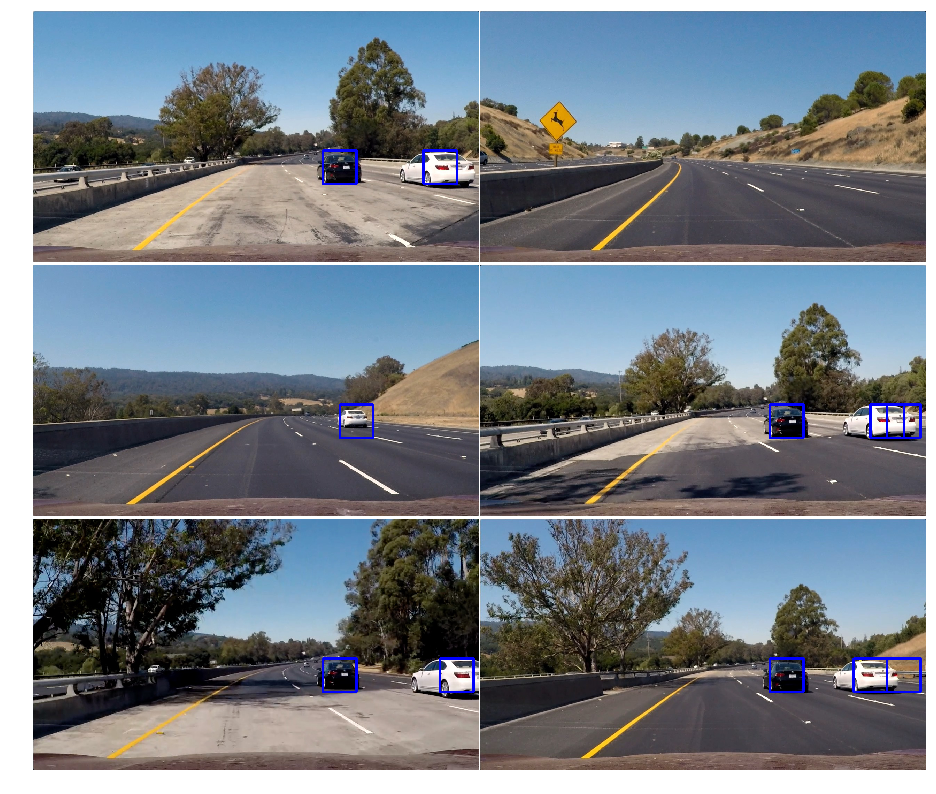

In [18]:
test_images = glob.glob('./test_images/test*.jpg')

fig, axs = plt.subplots(3, 2, figsize=(16,14))
fig.subplots_adjust(hspace = .004, wspace=.002)
axs = axs.ravel()

for i, im in enumerate(test_images):
    test_img = mpimg.imread(im)
    ystart = 400
    ystop = 656
    scale = 1.5
    orient = 9
    pix_per_cell = 16
    cell_per_block = 2
    hog_channel = 'ALL' # Can be 0, 1, 2, or "ALL"

    rectangles = find_cars(test_img, ystart, ystop, scale, hog_channel, svc, None, orient, pix_per_cell, cell_per_block, None, None)
    test_img_rects = draw_boxes(test_img, rectangles)
    axs[i].imshow(test_img_rects)
    axs[i].axis('off')
    

After this I explored several configurations of window sizes and positions which were taken by considering the size of the vehicle at different position in the image. For small size of the car the scale is 1.0x for medium 1.5 and large 2.5x . `ystart` and `ystop` determines the region of search in image . I have shown the search window for different scales that i will be usinf in the final implementation

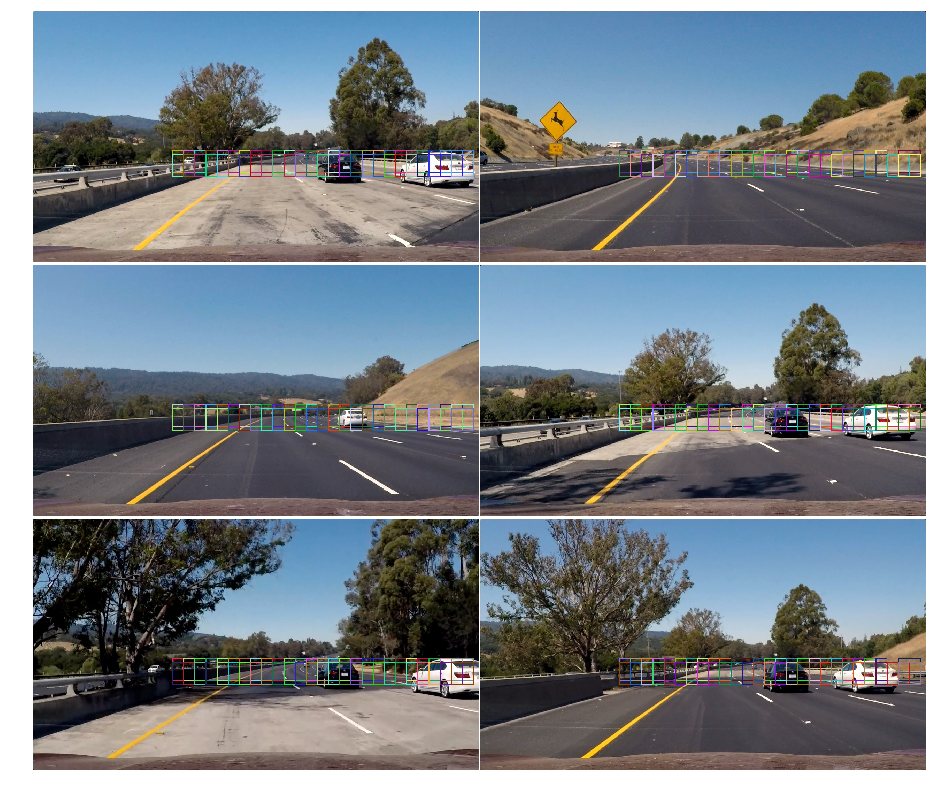

In [22]:
test_images = glob.glob('./test_images/test*.jpg')

fig, axs = plt.subplots(3, 2, figsize=(16,14))
fig.subplots_adjust(hspace = .004, wspace=.002)
axs = axs.ravel()

for i, im in enumerate(test_images):
    rects = []
    test_img = mpimg.imread(im)
    ystart = 400
    ystop = 470
    scale = 1.0
    rects.append(find_cars(test_img, ystart, ystop, scale, hog_channel, svc, None, 
                           orient, pix_per_cell, cell_per_block, None, None, show_all_rectangles=True))
    ystart = 410
    ystop = 480
    scale = 1.0
    rects.append(find_cars(test_img, ystart, ystop, scale, hog_channel, svc, None, 
                           orient, pix_per_cell, cell_per_block, None, None, show_all_rectangles=True))

    rectangles = [item for sublist in rects for item in sublist] 
    test_img_rects = draw_boxes(test_img, rectangles,color='random', thick=2)
    axs[i].imshow(test_img_rects)
    axs[i].axis('off')
    


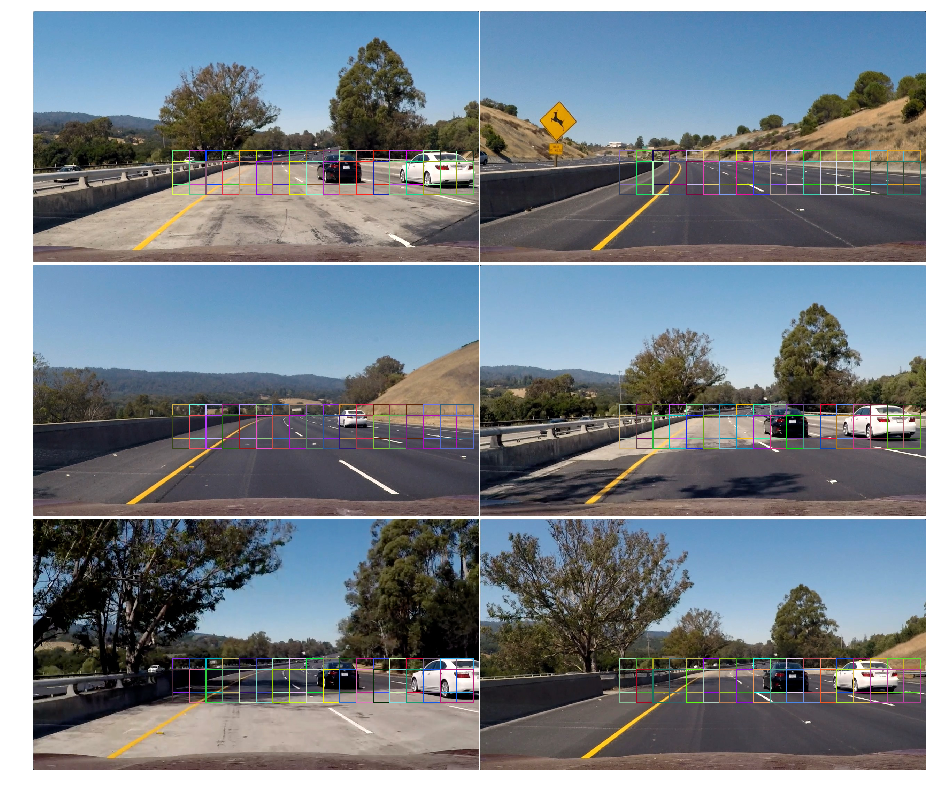

In [23]:
test_images = glob.glob('./test_images/test*.jpg')

fig, axs = plt.subplots(3, 2, figsize=(16,14))
fig.subplots_adjust(hspace = .004, wspace=.002)
axs = axs.ravel()

for i, im in enumerate(test_images):
    rects = []
    test_img = mpimg.imread(im)
    ystart = 400
    ystop = 500
    scale = 1.5
    rects.append(find_cars(test_img, ystart, ystop, scale, hog_channel, svc, None, 
                           orient, pix_per_cell, cell_per_block, None, None, show_all_rectangles=True))
    ystart = 430
    ystop = 530
    scale = 1.5
    rects.append(find_cars(test_img, ystart, ystop, scale, hog_channel, svc, None, 
                           orient, pix_per_cell, cell_per_block, None, None, show_all_rectangles=True))

    rectangles = [item for sublist in rects for item in sublist] 
    test_img_rects = draw_boxes(test_img, rectangles,color='random', thick=2)
    axs[i].imshow(test_img_rects)
    axs[i].axis('off')
    



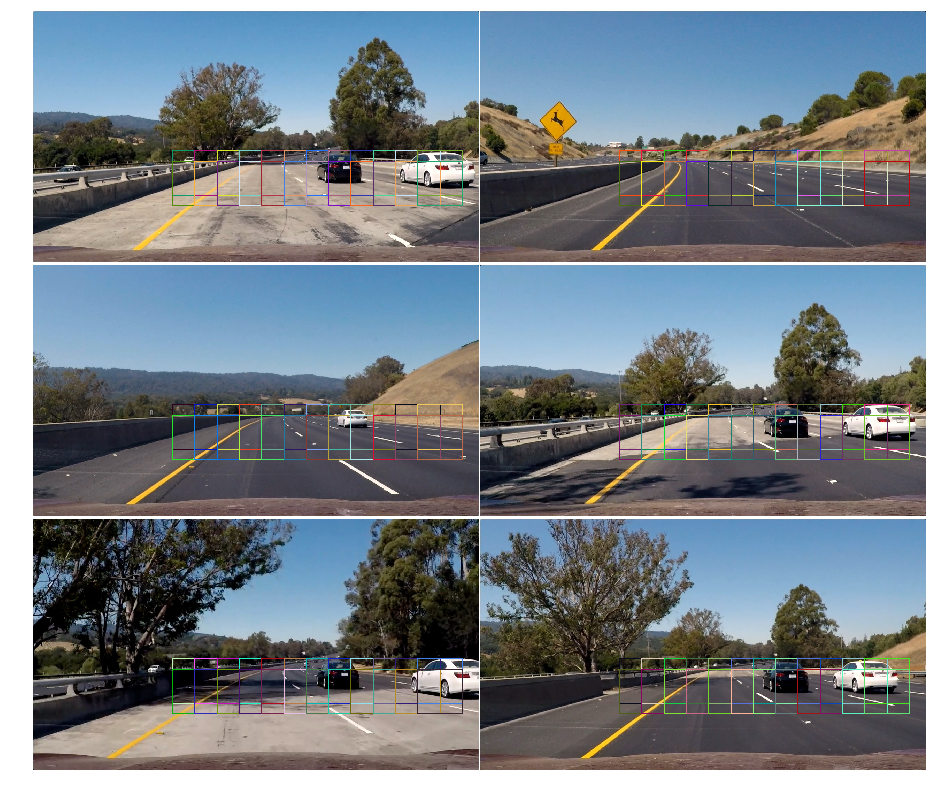

In [24]:
test_images = glob.glob('./test_images/test*.jpg')

fig, axs = plt.subplots(3, 2, figsize=(16,14))
fig.subplots_adjust(hspace = .004, wspace=.002)
axs = axs.ravel()

for i, im in enumerate(test_images):
    rects = []
    test_img = mpimg.imread(im)
    ystart = 400
    ystop = 550
    scale = 2.0
    rects.append(find_cars(test_img, ystart, ystop, scale, hog_channel, svc, None, 
                           orient, pix_per_cell, cell_per_block, None, None, show_all_rectangles=True))
    ystart = 430
    ystop = 580
    scale = 2.0
    rects.append(find_cars(test_img, ystart, ystop, scale, hog_channel, svc, None, 
                           orient, pix_per_cell, cell_per_block, None, None, show_all_rectangles=True))

    rectangles = [item for sublist in rects for item in sublist] 
    test_img_rects = draw_boxes(test_img, rectangles,color='random', thick=2)
    axs[i].imshow(test_img_rects)
    axs[i].axis('off')
    



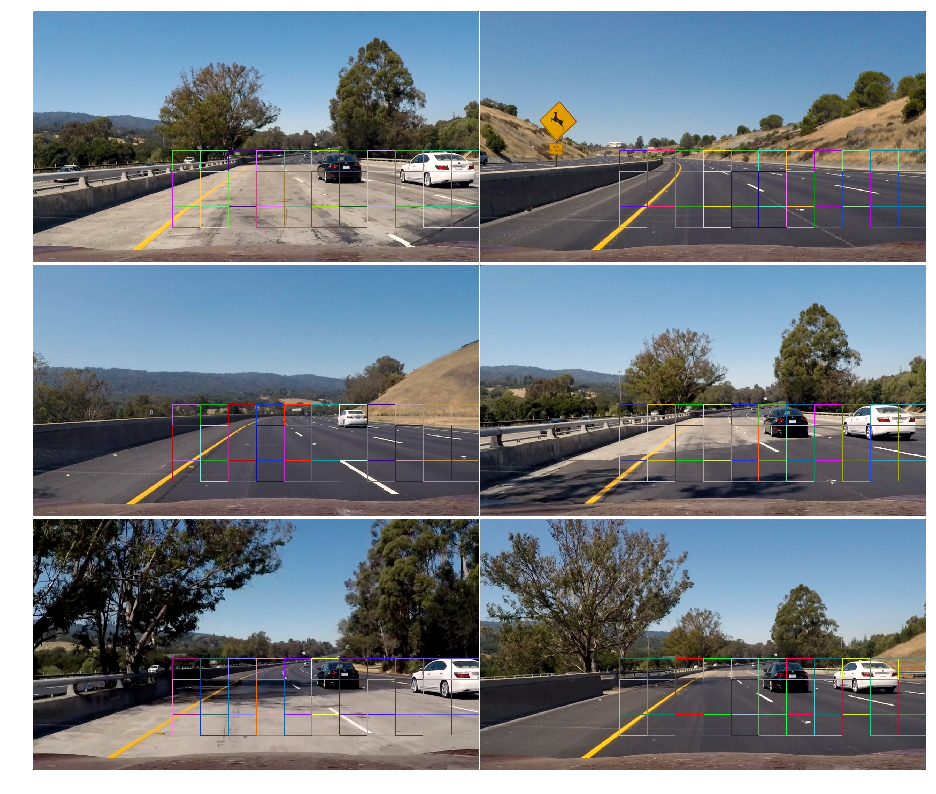

In [26]:
test_images = glob.glob('./test_images/test*.jpg')

fig, axs = plt.subplots(3, 2, figsize=(16,14))
fig.subplots_adjust(hspace = .004, wspace=.002)
axs = axs.ravel()

for i, im in enumerate(test_images):
    rects = []
    test_img = mpimg.imread(im)
    ystart = 400
    ystop = 600
    scale = 2.5
    rects.append(find_cars(test_img, ystart, ystop, scale, hog_channel, svc, None, 
                           orient, pix_per_cell, cell_per_block, None, None, show_all_rectangles=True))
    ystart = 460
    ystop = 660
    scale = 2.5
    rects.append(find_cars(test_img, ystart, ystop, scale, hog_channel, svc, None, 
                           orient, pix_per_cell, cell_per_block, None, None, show_all_rectangles=True))

    rectangles = [item for sublist in rects for item in sublist] 
    test_img_rects = draw_boxes(test_img, rectangles,color='random', thick=2)
    axs[i].imshow(test_img_rects)
    axs[i].axis('off')
    


The `final` car algorithm is called for each window scale and the rectangles returned from it car aggregated .
There were few false positive were detected on the left part of the image for the cars that were coming so I shrinked the size of my search region .While The scale factor can be set on different regions of the image (e.g. small near the horizon, larger in the center). The scaling implementation for different region with a different region helped in detecting the vehicle but also resulted in few false positive . Now the box detected by this scaling for true positive was more than that of the false positive region. So this resulted in the implementation of heat map stratergy that I will be explaining below.

`test_pipe` function is a demo function to test the affect of function on test images on test images. It is mainly used to show heat map operations


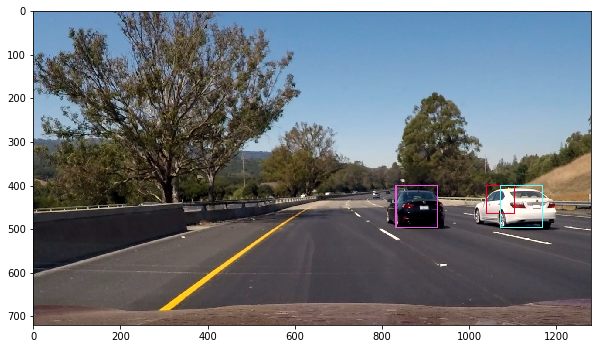

In [33]:

test_img = mpimg.imread('./test_images/test6.jpg')

def test_pipe(test_img): 

    rectangles = []
    ystart_list=[400,400,400,400,450,450,450]
    ystop_list=[460,480,500,530,560,600,660]
    orient = 9
    pix_per_cell = 16
    cell_per_block = 2
    hog_channel = 'ALL' # Can be 0, 1, 2, or "ALL"


    ystart = ystart_list[0]
    ystop = ystop_list[0]
    scale = 1.0
    rectangles.append(find_cars(test_img, ystart, ystop, scale, hog_channel, svc, None, 
                            orient, pix_per_cell, cell_per_block, None, None))


    ystart = ystart_list[1]
    ystop = ystop_list[1]
    scale = 1.0
    rectangles.append(find_cars(test_img, ystart, ystop, scale, hog_channel, svc, None, 
                            orient, pix_per_cell, cell_per_block, None, None))

    ystart = ystart_list[2]
    ystop = ystop_list[2]
    scale = 1.5
    rectangles.append(find_cars(test_img, ystart, ystop, scale, hog_channel, svc, None, 
                            orient, pix_per_cell, cell_per_block, None, None))

    ystart = ystart_list[3]
    ystop = ystop_list[3]
    scale = 1.5
    rectangles.append(find_cars(test_img, ystart, ystop, scale, hog_channel, svc, None, 
                            orient, pix_per_cell, cell_per_block, None, None))


    ystart = ystart_list[4]
    ystop = ystop_list[4]
    scale = 2.0
    rectangles.append(find_cars(test_img, ystart, ystop, scale, hog_channel, svc, None, 
                            orient, pix_per_cell, cell_per_block, None, None))

    ystart = ystart_list[5]
    ystop = ystop_list[5]
    scale = 2.5
    rectangles.append(find_cars(test_img, ystart, ystop, scale, hog_channel, svc, None, 
                            orient, pix_per_cell, cell_per_block, None, None))

    ystart = ystart_list[6]
    ystop = ystop_list[6]
    scale = 2.5
    rectangles.append(find_cars(test_img, ystart, ystop, scale, hog_channel, svc, None, 
                            orient, pix_per_cell, cell_per_block, None, None))

    # apparently this is the best way to flatten a list of lists
    rectangles = [item for sublist in rectangles for item in sublist] 
    return rectangles
rectangles = test_pipe(test_img)
test_img_rects = draw_boxes(test_img, rectangles, color='random', thick=2)
plt.figure(figsize=(10,10))
plt.imshow(test_img_rects)

Since a true positive is accompanied by many bounding boxes while the false positive is detected by only one or two bounding box, a combination of heatmap and threshold is used to differentiate them . The `add_heat` function increments the pixel value of the original image at the location of each detection rectangle. Those Areas that are encompassed by more overlapping rectangles are assigned higher levels of heat. 

In [31]:
def add_heat(heatmap, bbox_list):
    # Iterate through list of bboxes
    for box in bbox_list:
        # Add += 1 for all pixels inside each bbox
        # Assuming each "box" takes the form ((x1, y1), (x2, y2))
        heatmap[box[0][1]:box[1][1], box[0][0]:box[1][0]] += 1

    # Return updated heatmap
    return heatmap

def apply_threshold(heatmap, threshold):
    # Zero out pixels below the threshold
    heatmap[heatmap <= threshold] = 0
    # Return thresholded map
    return heatmap

Vistualiztion of heatmap and thresholding for one of the test image

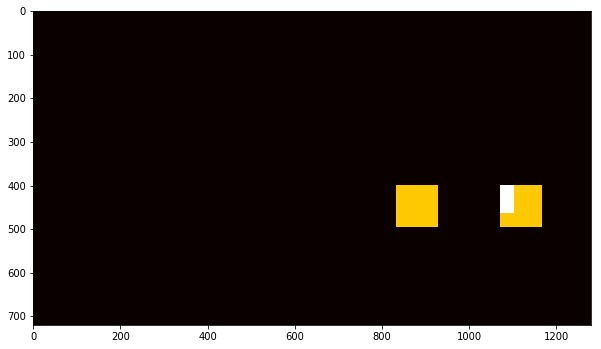

In [47]:
heatmap_img = np.zeros_like(test_img[:,:,0])
heatmap_img = add_heat(heatmap_img, rectangles)
heatmap_img = apply_threshold(heatmap_img, 1)
plt.figure(figsize=(10,10))
plt.imshow(heatmap_img, cmap='hot')

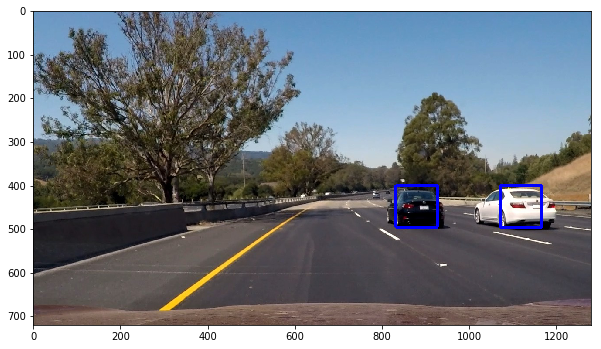

In [48]:
def draw_labeled_bboxes(img, labels):
    # Iterate through all detected cars
    rects = []
    for car_number in range(1, labels[1]+1):
        # Find pixels with each car_number label value
        nonzero = (labels[0] == car_number).nonzero()
        # Identify x and y values of those pixels
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        # Define a bounding box based on min/max x and y
        bbox = ((np.min(nonzerox), np.min(nonzeroy)), (np.max(nonzerox), np.max(nonzeroy)))
        rects.append(bbox)
        # Draw the box on the image
        cv2.rectangle(img, bbox[0], bbox[1], (0,0,255), 6)
    # Return the image and final rectangles
    return img, rects

# Draw bounding boxes on a copy of the image
draw_img, rect = draw_labeled_bboxes(np.copy(test_img), labels)
# Display the image
plt.figure(figsize=(10,10))
plt.imshow(draw_img)

In [52]:
from collections import deque
avgheat=deque(maxlen=20)

In [50]:


def process_image(img):

    rectangles = []
    ystart_list=[400,400,400,400,450,450,450]
    ystop_list=[460,480,500,530,560,600,660]

    orient = 9
    pix_per_cell = 16
    cell_per_block = 2
    hog_channel = 'ALL' # Can be 0, 1, 2, or "ALL"

    ystart = ystart_list[0]
    ystop = ystop_list[0]
    scale = 1.0
    rectangles.append(find_cars(img, ystart, ystop, scale, hog_channel, svc, None, 
                           orient, pix_per_cell, cell_per_block, None, None))
    ystart = ystart_list[1]
    ystop = ystop_list[1]
    scale = 1.0
    rectangles.append(find_cars(img, ystart, ystop, scale,  hog_channel, svc, None, 
                           orient, pix_per_cell, cell_per_block, None, None))
    ystart = ystart_list[2]
    ystop = ystop_list[2]
    scale = 1.5
    rectangles.append(find_cars(img, ystart, ystop, scale,  hog_channel, svc, None, 
                           orient, pix_per_cell, cell_per_block, None, None))
    ystart = ystart_list[3]
    ystop = ystop_list[3]
    scale = 1.5
    rectangles.append(find_cars(img, ystart, ystop, scale,  hog_channel, svc, None, 
                           orient, pix_per_cell, cell_per_block, None, None))
    ystart = ystart_list[4]
    ystop = ystop_list[4]
    scale = 2.0
    rectangles.append(find_cars(img, ystart, ystop, scale,  hog_channel, svc, None, 
                           orient, pix_per_cell, cell_per_block, None, None))
    ystart = ystart_list[5]
    ystop = ystop_list[5]
    scale = 2.5
    rectangles.append(find_cars(img, ystart, ystop, scale,  hog_channel, svc, None, 
                           orient, pix_per_cell, cell_per_block, None, None))
    ystart = ystart_list[6]
    ystop = ystop_list[6]
    scale = 2.5
    rectangles.append(find_cars(img, ystart, ystop, scale,  hog_channel, svc, None, 
                           orient, pix_per_cell, cell_per_block, None, None))

    rectangles = [item for sublist in rectangles for item in sublist] 
    
    heatmap_img = np.zeros_like(img[:,:,0])
    heatmap_img = add_heat(heatmap_img, rectangles)
    avgheat.append(heatmap_img)
    heat_average = np.sum(avgheat,axis=0)
    
    heatmap_img = apply_threshold(heat_average, 1)
    labels = label(heat_average)
    draw_img, rects = draw_labeled_bboxes(np.copy(img), labels)
    
    
    return  draw_img



#### 2. Show some examples of test images to demonstrate how your pipeline is working.  What did you do to optimize the performance of your classifier?

The final implementation performs well. Though we can see few false positive in the test images but its due to the technique that i used to sum the heat_map and detect the bounding box . As we can see the cars in very first images are detected properly . Now a record for these bounding box is stored in the deque and is used to detect box in the other frame. In this case the the second image without car is acting as the second frame so we can see the false positive . Kindly refer the video to see how this technique smoothly detects the vehicle.

In order to optimize the performance i used Linear SVM with YCbCr color space. I first worked with an orientation value of 11 but then the accuracy was not good so i tweaked it to 9. Also to reduce the false positive i did some data augmentation on the training data by fliping the  images of cars and noncars 

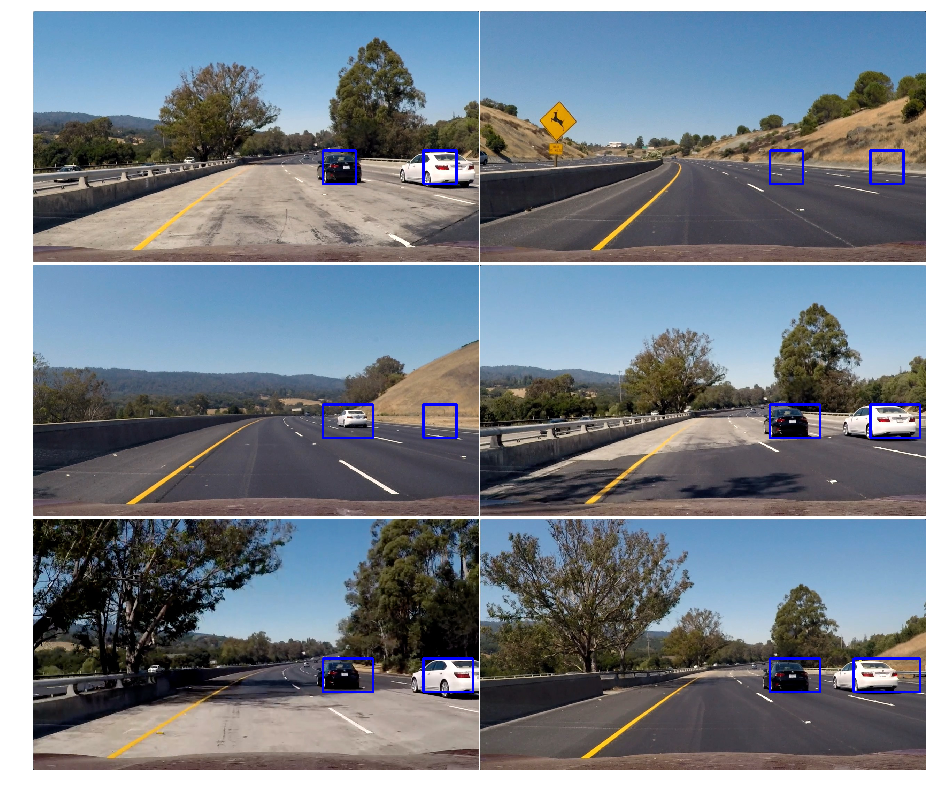

In [51]:
test_images = glob.glob('./test_images/test*.jpg')

fig, axs = plt.subplots(3, 2, figsize=(16,14))
fig.subplots_adjust(hspace = .004, wspace=.002)
axs = axs.ravel()

for i, im in enumerate(test_images):
    axs[i].imshow(process_image(mpimg.imread(im)))
    axs[i].axis('off')


### Video Implementation

#### 1. Provide a link to your final video output.  Your pipeline should perform reasonably well on the entire project video (somewhat wobbly or unstable bounding boxes are ok as long as you are identifying the vehicles most of the time with minimal false positives.)

In [53]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML
output = 'project_video_output.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0,5)
clip1 = VideoFileClip("project_video.mp4")
white_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
%time white_clip.write_videofile(output, audio=False)

[MoviePy] >>>> Building video project_video_output.mp4
[MoviePy] Writing video project_video_output.mp4


100%|█████████████████████████████████████████████████████████████████████████████▉| 1260/1261 [07:07<00:00,  2.78it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_output.mp4 

Wall time: 7min 9s


In [54]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(output))

#### 2. Describe how (and identify where in your code) you implemented some kind of filter for false positives and some method for combining overlapping bounding boxes.

I recorded the positions of positive detections in each frame of the video.  From the positive detections I created a heatmap and then thresholded that map to identify vehicle positions.I stored that position in the deque of size 20 so as to store the positions detected in atmost 20 frames and then new frames may be introduced.I then perform addition on the frame heat map with all the heatmap in the deque and then used `scipy.ndimage.measurements.label()` to identify individual blobs in the heatmap.  I then assumed each blob corresponded to a vehicle.  I constructed bounding boxes to cover the area of each blob detected.  


### Here are six frames and their corresponding heatmaps:

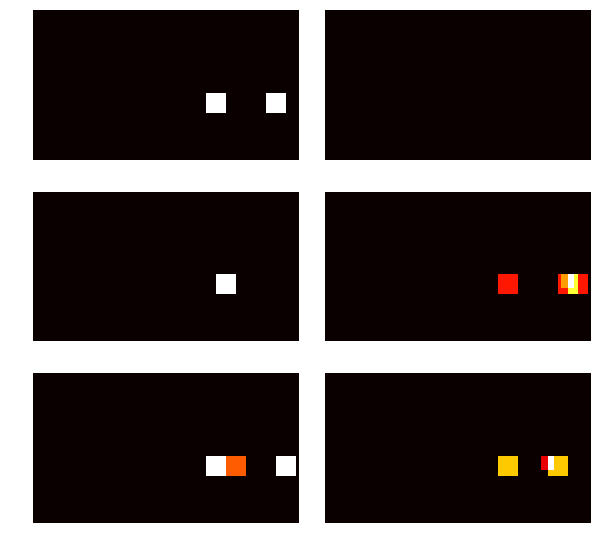

In [46]:
test_images = glob.glob('./test_images/test*.jpg')

fig, axs = plt.subplots(3, 2, figsize=(10,10))
fig.subplots_adjust(hspace = .004, wspace=.1)
axs = axs.ravel()

for i, im in enumerate(test_images):
    test_img = mpimg.imread(im)
    bbox_list = test_pipe(test_img)
    heatmap_img = np.zeros_like(test_img[:,:,0])
    heat_image=add_heat(heatmap_img, bbox_list)
    axs[i].imshow(heat_image,cmap="hot")
    axs[i].axis('off')




### Here is the output of `scipy.ndimage.measurements.label()` on the integrated heatmap from all six frames:



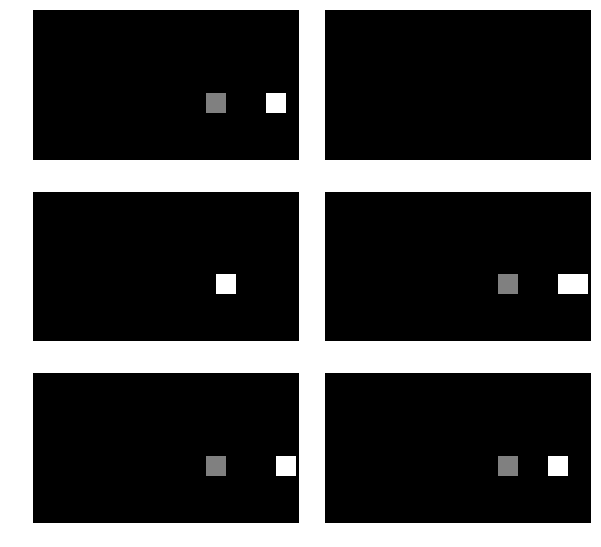

In [45]:
test_images = glob.glob('./test_images/test*.jpg')

fig, axs = plt.subplots(3, 2, figsize=(10,10))
fig.subplots_adjust(hspace = .004, wspace=.1)
axs = axs.ravel()

for i, im in enumerate(test_images):
    test_img = mpimg.imread(im)
    bbox_list = test_pipe(test_img)
    heatmap_img = np.zeros_like(test_img[:,:,0])
    heat_image=add_heat(heatmap_img, bbox_list)
    heatmap_img = apply_threshold(heat_image, 1)
    labels = label(heatmap_img)
    axs[i].imshow(labels[0], cmap='gray')
    axs[i].axis('off')

### Discussion

#### 1. Briefly discuss any problems / issues you faced in your implementation of this project.  Where will your pipeline likely fail?  What could you do to make it more robust?

I started out with a linear SVM and the data that were provided in the lessons . But that resulted in less accuracy . When i finally tuned the parameter i was still getting lots of false positive which i was unable to get rid of using heat map technique also as the false positive regions were enclosed by many flase boundry .  In order to remove that I finally decided to augment the training data and it not only increased the accuracy but alse helped in removing the false positive.

The pipeline may fail in the case when the car will overtake my car from left side as i have shrinked the search region to get rid of the false detection from the car coming from the opposite lane.

Some false positives still remain after heatmap filtering. This should be improvable by using more labeled data and tunnig parameter.

